# Projekt Text Mining: Sentiment Analyse STAR WARS
## Datenanalyse Sheet

![Ein Beispielbild](https://i.pinimg.com/236x/5c/44/23/5c442361e839296d50d69bb14d9de68a.jpg) 


### 1. Daten aus Json einlesen und in Pandas Dataframe umwandeln

- Dataframe Name: **StarWars**
- Columns: 
    - film_id: ID des Films
    - titel: 23 verschiedene Filmtitel
    - jahr: Erscheinungsjahr des Films (von 1977 bis 2023)
    - kategorie: Kombination aus 3 Genre (z.B. "Adventure, Family, Musical")
    - review_id: ID der Rezension
    - username: Name des Verfassers
    - gesamtbewertung: Gesamtbewertung des Films gemäß IMDb. Unterscheidet sich von "Rating", da IMDb unterschiedlich gewichtet (Min: 2.2 Max: 8.7)
    - rating: Sterne, die der User vergibt (Min: 1 Max: 10)           
    - date: Datum, an dem die Bewertung abgegeben wurde (z.B. 1 February 2024)
    - review_caption: Überschrift/Motto/kurze Zusammenfassung der Bewertung
    - bewertung: Beurteilung durch den User als Text


In [1]:
import pandas as pd
import json

In [2]:
file_path="filme_rezensionen_extendet.json"
with open(file_path, 'r', encoding='utf-8') as f:
    data = json.load(f)

In [3]:
data

{'tt0089110': {'titel': 'Kampf um Endor',
  'jahr': '1985',
  'Anzahl Rezessionen': '49',
  'rezensionen': [{'data-review-id': 'rw9598497',
    'username': 'alesterage',
    'rating': '2',
    'date': '1 February 2024',
    'title': 'A generic low-quality fantasy movie disguised as a Star Wars film',
    'text': "The title basically sums up everything you need to know about this movie. If low-quality generic fantasy flicks are your guilty pleasure, then you can give it a watch. However, if you're a Star Wars, sci-fi or action movie fans, then you can pretty much forget that this movie exists. There's nothing of value for you here. It's not part of the Star Wars canon (yes, even the expanded universe), the sci-fi elements are almost not present and the action quality is very bad. It's just another project created solely for the purpose of making more money.The only reason why I'm giving it a 2 instead of 1 is because at least this movie is somewhat watchable. But don't expect anything m

In [4]:
list_rows = [] #Liste für Zeilendaten

for film_id, film_info in data.items():          #Iteration durch jedes Filmobjekt
    kategorie = ', '.join(film_info.get('kategorie', []))
    gesamtbewertung = film_info.get('gesamtbewertung', [])
    for rezension in film_info['rezensionen']: #für jede Rezension wird neues Dictionary erstellt
        
        row ={ 
            'film_id':film_id,
            'titel': film_info['titel'],
            'jahr': film_info['jahr'],
            'kategorie':kategorie,
            'review_id': rezension['data-review-id'],
            'username': rezension['username'],
            'gesamtbewertung': gesamtbewertung,
            'rating': rezension['rating'],
            'date': rezension['date'],
            'review_caption':rezension['title'],
            'bewertung':rezension['text']
        }
        list_rows.append(row)           # jedes Dictionary wird der Liste zugefügt

StarWars = pd.DataFrame(list_rows)     # jedes Dictionary wird als Zeile dem Pandas DataFrame hinzugefügt
StarWars['ID'] = range(1, len(StarWars) + 1) # einen Index hinzufügen und an die erste Position setzen
StarWars['ID'] = StarWars['ID'].astype(str)
spalten = ['ID'] + [spalte for spalte in StarWars.columns if spalte != 'ID']
StarWars = StarWars[spalten]
StarWars.head()
        

,ID,film_id,titel,jahr,kategorie,review_id,username,gesamtbewertung,rating,date,review_caption,bewertung
0,1,tt0089110,Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9598497,alesterage,5.4,2,1 February 2024,A generic low-quality fantasy movie disguised ...,The title basically sums up everything you nee...
1,2,tt0089110,Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9522494,rarepunkrock,5.4,7,27 December 2023,Bit of a Hidden Gem,"Somehow I missed this back in my childhood, wh..."
2,3,tt0089110,Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9491218,pb93,5.4,5,12 December 2023,One for toddlers and completionists,"I'm currently in the process of trying to ""com..."
3,4,tt0089110,Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9345213,adamjohns-42575,5.4,5,27 September 2023,Yubnub!,Ewoks: The Battle For Endor (1985) -Despite th...
4,5,tt0089110,Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9249709,TBJCSKCNRRQTreviews,5.4,7,10 August 2023,"No, not her, she's evil!","When marauders attack, Cindel and Wicket are f..."


In [5]:
StarWars['date'] = pd.to_datetime(StarWars['date'], format='%d %B %Y') # Datum umwandeln

In [6]:
StarWars['rating'] = pd.to_numeric(StarWars['rating'], errors='coerce') #in numerische Daten umwandeln
StarWars['gesamtbewertung'] = pd.to_numeric(StarWars['gesamtbewertung'], errors='coerce')
StarWars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31041 entries, 0 to 31040
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   ID               31041 non-null  object        
 1   film_id          31041 non-null  object        
 2   titel            31041 non-null  object        
 3   jahr             31041 non-null  object        
 4   kategorie        31041 non-null  object        
 5   review_id        31041 non-null  object        
 6   username         31041 non-null  object        
 7   gesamtbewertung  28752 non-null  float64       
 8   rating           28613 non-null  float64       
 9   date             31041 non-null  datetime64[ns]
 10  review_caption   31041 non-null  object        
 11  bewertung        31041 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(9)
memory usage: 2.8+ MB


---

### 2. Datenbereinigung


- Titel wurden entsprechend angepasst, sodass einheitliches Schema

In [7]:
# Filmtitel ändern

StarWars['titel'] =StarWars['titel'].replace('Das Imperium schlägt zurück', 'Star Wars: Episode V - Das Imperium schlägt zurück')
StarWars['titel'] =StarWars['titel'].replace('Krieg der Sterne', 'Star Wars: Episode IV - Krieg der Sterne')
StarWars['titel'] =StarWars['titel'].replace('Die Rückkehr der Jedi-Ritter', 'Star Wars: Episode VI - Die Rückkehr der Jedi-Ritter')
StarWars['titel'] =StarWars['titel'].replace('Kampf um Endor', 'Star Wars: Ewoks - Kampf um Endor')
StarWars['titel'] =StarWars['titel'].replace('Star Wars - Episode VII: Das Erwachen der Macht', 'Star Wars: Episode VII - Das Erwachen der Macht')
StarWars['titel'] =StarWars['titel'].replace('Star Wars - Episode IX: Der Aufstieg Skywalkers', 'Star Wars: Episode IX - Der Aufstieg Skywalkers')
StarWars['titel'] =StarWars['titel'].replace('Star Wars - Episode VIII: Die letzten Jedi', 'Star Wars: Episode VIII - Die letzten Jedi')

### 2.1 NA Werte entfernen bzw. Werte für NA einfügen

- 2428 fehlende Werte bei Rating (User haben zwar eine Rezension geschrieben aber keine Sternebewertung abgegeben). Nachfolgend werden diese entfernt, da für die Analyse sowohl Rezension als auch Rating vorhanden sein sollen -> 28.613 Zeilen bleiben
- 2289 fehlende Werte bei der Gesamtbewertung und Kategorie des Films "Star Wars: Episode III - Die Rache der Sith". Die Gesamtbewertung liegt bei 7.6 (Stand 10.02.2024), Kategorie 'Action, Abenteuer, Fantasy'. Alle NA Werte werden entsprechend ersetzt
- Im Datensatz findet sich zweimal der selbe Titel "Star Wars: The Clone Wars" wieder. Beide besitzen allerdings eine unterschiedliche Film ID ("tt0458290" und "tt1185834"). Auch auf IMDb ist der Filmtitel zweimal gelistet, wobei es sich einmal nur um die Staffel von 2008 zu handeln scheint, während "tt0458290" alle Staffeln von 2008 bis 2020 abdeckt. Die Film IDs werden entsprechend zusammengefasst.
- Zwei Titel weisen nur eine geringe Anzahl an Bewertungen auf (Star Wars: Die Abenteuer der jungen Jedi mit 14 und Star Wars: Larry mit 1 Bewertung/en). Diese Titel wurden entfernt, da Ergebnisse hier wenig aussagekräftig wären.
- Durch das entfernen der NaN-Werte bei 'Rating' und der beiden Filme weist das Dataframe nun **28.598** Zeilen auf (von ursprünglich 31.041 Zeilen). Mit diesem Datensatz wird entsprechend weitergrechnet.


In [8]:
nan_count = StarWars.isna().sum()
print(nan_count)



ID                    0
film_id               0
titel                 0
jahr                  0
kategorie             0
review_id             0
username              0
gesamtbewertung    2289
rating             2428
date                  0
review_caption        0
bewertung             0
dtype: int64


In [9]:
StarWars['rating_na'] = StarWars['rating'].isna() #einfügen einer Spalte, die TRUE für NA Werte in 'Rating' setzt
NaN_Filme_Rating = StarWars.groupby(['film_id', 'titel'])['rating_na'].sum() #Anzahl NA Werte gruppiert nach Film
print(NaN_Filme_Rating)

film_id     titel                                               
tt0076759   Star Wars: Episode IV - Krieg der Sterne                230
tt0080684   Star Wars: Episode V - Das Imperium schlägt zurück      127
tt0086190   Star Wars: Episode VI - Die Rückkehr der Jedi-Ritter     95
tt0087225   Star Wars: Ewoks - Karawane der Tapferen                  7
tt0089110   Star Wars: Ewoks - Kampf um Endor                         9
tt0120915   Star Wars: Episode I - Die dunkle Bedrohung             740
tt0121765   Star Wars: Episode II - Angriff der Klonkrieger         618
tt0121766   Star Wars: Episode III - Die Rache der Sith              83
tt0193524   The Star Wars Holiday Special                            67
tt0361243   Star Wars: Clone Wars                                    24
tt0458290   Star Wars: The Clone Wars                                 8
tt1185834   Star Wars: The Clone Wars                                 5
tt12708542  Star Wars: The Bad Batch                                  4

In [10]:

StarWars.dropna(subset=['rating'], inplace=True)

In [11]:
NaN_Filme_Gesamtbewertung = StarWars[StarWars['gesamtbewertung'].isna()]
print(NaN_Filme_Gesamtbewertung[['film_id', 'titel', 'jahr', 'gesamtbewertung']])

         film_id                                        titel  jahr  \
10281  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
10282  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
10283  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
10284  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
10285  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
...          ...                                          ...   ...   
12565  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
12566  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
12567  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
12568  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   
12569  tt0121766  Star Wars: Episode III - Die Rache der Sith  2005   

       gesamtbewertung  
10281              NaN  
10282              NaN  
10283              NaN  
10284              NaN  
10285              NaN

In [12]:
film = 'Star Wars: Episode III - Die Rache der Sith' # Kategorie und Gesamtbewertung bei Episode 3 fehlt -> hinzufügen

kategorie_add = 'Action, Abenteuer, Fantasy'
gesamtbewertung_add = 7.6
StarWars.loc[StarWars['titel'] == film, 'kategorie'] = kategorie_add
StarWars.loc[StarWars['titel'] == film, 'gesamtbewertung'] = gesamtbewertung_add

In [13]:
nan_count = StarWars.isna().sum()
print(nan_count)




ID                 0
film_id            0
titel              0
jahr               0
kategorie          0
review_id          0
username           0
gesamtbewertung    0
rating             0
date               0
review_caption     0
bewertung          0
rating_na          0
dtype: int64


In [14]:
StarWars['film_id'] = StarWars['film_id'].replace({'tt1185834': 'tt0458290'})

In [15]:
bewertungen_pro_film = StarWars.groupby('titel')['bewertung'].count().sort_values(ascending=False)
print(bewertungen_pro_film)

titel
Star Wars: Episode IX - Der Aufstieg Skywalkers         6064
Star Wars: Episode VIII - Die letzten Jedi              4253
Star Wars: Episode I - Die dunkle Bedrohung             2783
Star Wars: Episode II - Angriff der Klonkrieger         2545
Star Wars: Episode VII - Das Erwachen der Macht         2449
Star Wars: Episode III - Die Rache der Sith             2206
Solo: A Star Wars Story                                 2136
Star Wars: Episode IV - Krieg der Sterne                1564
Star Wars: Rogue One                                    1255
Star Wars: Episode V - Das Imperium schlägt zurück       995
Star Wars: Episode VI - Die Rückkehr der Jedi-Ritter     618
Star Wars: The Clone Wars                                523
Star Wars: The Bad Batch                                 255
The Star Wars Holiday Special                            212
Star Wars: Visions                                       191
Star Wars: Resistance                                    167
Star Wars Rebels  

In [16]:
titel_entfernen = ['Star Wars: Larry', 'Star Wars: Die Abenteuer der jungen Jedi']
StarWars = StarWars[~StarWars['titel'].isin(titel_entfernen)]



In [17]:
del StarWars['rating_na']
StarWars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28598 entries, 0 to 31026
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   ID               28598 non-null  object        
 1   film_id          28598 non-null  object        
 2   titel            28598 non-null  object        
 3   jahr             28598 non-null  object        
 4   kategorie        28598 non-null  object        
 5   review_id        28598 non-null  object        
 6   username         28598 non-null  object        
 7   gesamtbewertung  28598 non-null  float64       
 8   rating           28598 non-null  float64       
 9   date             28598 non-null  datetime64[ns]
 10  review_caption   28598 non-null  object        
 11  bewertung        28598 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(9)
memory usage: 2.8+ MB


In [18]:
StarWars.head(30)

,ID,film_id,titel,jahr,kategorie,review_id,username,gesamtbewertung,rating,date,review_caption,bewertung
0,1,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9598497,alesterage,5.4,2.0,2024-02-01,A generic low-quality fantasy movie disguised ...,The title basically sums up everything you nee...
1,2,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9522494,rarepunkrock,5.4,7.0,2023-12-27,Bit of a Hidden Gem,"Somehow I missed this back in my childhood, wh..."
2,3,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9491218,pb93,5.4,5.0,2023-12-12,One for toddlers and completionists,"I'm currently in the process of trying to ""com..."
3,4,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9345213,adamjohns-42575,5.4,5.0,2023-09-27,Yubnub!,Ewoks: The Battle For Endor (1985) -Despite th...
4,5,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9249709,TBJCSKCNRRQTreviews,5.4,7.0,2023-08-10,"No, not her, she's evil!","When marauders attack, Cindel and Wicket are f..."
5,6,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw8951260,gregorydonovan-51058,5.4,9.0,2023-03-26,I would sell my first born to watch this movie...,An epic on par with homers odyssey and the Ili...
6,7,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw8383408,IonicBreezeMachine,5.4,5.0,2022-07-30,"It's more cohesive than the last Ewok movie, b...","On the planet Endor, Cindel (Aubree Miller) an..."
7,8,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw8303732,kingofdanerds,5.4,6.0,2022-07-05,An improvement over the near unbearable Carava...,"1984's Ewok movie, Caravan of Courage proved t..."
8,9,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw7952717,kelvinselimor,5.4,6.0,2022-03-13,The adventure continues.,Ewoks: The Battle for Endor. The adventure con...
9,10,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw7617949,markzipperboy2,5.4,1.0,2021-12-05,An Abomination,"Awful on every level. Costumes, story, effects..."


In [19]:
beispiel_neg = StarWars.loc[147,['bewertung', 'rating']]
print(beispiel_neg)

bewertung    This movie is along the lines of force awakens...
rating                                                     1.0
Name: 147, dtype: object


---

## 3. Deskriptive Statistik
- Mittelwert über alle Filme hinweg:
    - Gesamtbewertung: 7.07 (Am schlechtesten: The Star Wars Holiday Special / Am besten: Star Wars: Episode V - Das Imperium schlägt zurück); std: 0.86
    - Rating: 6.43 (Am schlechtesten: The Star Wars Holiday Special / Am besten: Star Wars: Episode V - Das Imperium schlägt zurück); std: 3.21
- Der älteste Film: Star Wars: Episode IV - Krieg der Sterne  1977
- Der aktuellste Film: Star Wars: Geschichten der Jedi  2022


In [20]:
statistik_num = StarWars.describe()
transp_statistik_num = statistik_num.transpose()
print(transp_statistik_num)

                   count      mean       std  min  25%  50%  75%   max
gesamtbewertung  28598.0  7.065361  0.862468  2.2  6.5  6.9  7.8   8.7
rating           28598.0  6.425344  3.217757  1.0  4.0  7.0  9.0  10.0


In [21]:
statistik_objects = StarWars.describe(include=[object])
transp_statistik_objects = statistik_objects.transpose()
print(transp_statistik_objects)
                                      

                count unique  \
ID              28598  28598   
film_id         28598     21   
titel           28598     21   
jahr            28598     19   
kategorie       28598      7   
review_id       28598  28598   
username        28598  23047   
review_caption  28598  26258   
bewertung       28598  28570   

                                                              top   freq  
ID                                                              1      1  
film_id                                                 tt2527338   6064  
titel             Star Wars: Episode IX - Der Aufstieg Skywalkers   6064  
jahr                                                         2019   6064  
kategorie                              Action, Adventure, Fantasy  18822  
review_id                                               rw9598497      1  
username                                           paul_haakonsen     18  
review_caption                                      Disappointing     52  
bewe

#### Gesamtbewertung nach Film, aufsteigend sortiert

In [22]:
gesamtbewertung_pro_film = StarWars.groupby('titel')['gesamtbewertung'].agg(['mean']).reset_index().sort_values(by='mean', ascending=True)
print(gesamtbewertung_pro_film)

                                                titel      mean
20                      The Star Wars Holiday Special  2.200000
15                              Star Wars: Resistance  5.300000
13           Star Wars: Ewoks - Karawane der Tapferen  5.300000
12                  Star Wars: Ewoks - Kampf um Endor  5.400000
7     Star Wars: Episode IX - Der Aufstieg Skywalkers  6.400000
3         Star Wars: Episode I - Die dunkle Bedrohung  6.500000
4     Star Wars: Episode II - Angriff der Klonkrieger  6.600000
11         Star Wars: Episode VIII - Die letzten Jedi  6.900000
0                             Solo: A Star Wars Story  6.900000
19                                 Star Wars: Visions  7.000000
18                          Star Wars: The Clone Wars  7.319694
5         Star Wars: Episode III - Die Rache der Sith  7.600000
2                               Star Wars: Clone Wars  7.800000
16                               Star Wars: Rogue One  7.800000
17                           Star Wars: 

#### Durchschnitt und Standardabweichung der Ratings, gruppiert nach Film und aufsteigend sortiert nach Durchschnitt

In [23]:
rating_pro_film = StarWars.groupby('titel')['rating'].agg(['mean', 'std']).reset_index().sort_values(by='mean', ascending=True)
print(rating_pro_film)

                                                titel      mean       std
20                      The Star Wars Holiday Special  3.452830  3.406523
11         Star Wars: Episode VIII - Die letzten Jedi  4.108159  3.344315
15                              Star Wars: Resistance  4.449102  3.257353
7     Star Wars: Episode IX - Der Aufstieg Skywalkers  5.944756  3.259073
19                                 Star Wars: Visions  5.947644  2.912294
12                  Star Wars: Ewoks - Kampf um Endor  5.950000  2.908432
10    Star Wars: Episode VII - Das Erwachen der Macht  6.133524  3.165592
3         Star Wars: Episode I - Die dunkle Bedrohung  6.596479  2.884167
4     Star Wars: Episode II - Angriff der Klonkrieger  6.653438  2.896561
13           Star Wars: Ewoks - Karawane der Tapferen  6.783784  2.647170
17                           Star Wars: The Bad Batch  6.800000  2.745648
1                                    Star Wars Rebels  6.872727  3.078572
0                             Solo: A 

In [24]:
min_jahr = int(StarWars['jahr'].min())
max_jahr = int(StarWars['jahr'].max())

aeltester_film = StarWars[StarWars['jahr'] == str(min_jahr)][['titel', 'jahr']].drop_duplicates(subset=['titel'])
neuester_film = StarWars[StarWars['jahr'] == str(max_jahr)][['titel', 'jahr']].drop_duplicates(subset=['titel'])

print(aeltester_film)
print(neuester_film)

                                          titel  jahr
12570  Star Wars: Episode IV - Krieg der Sterne  1977
                                 titel  jahr
30615  Star Wars: Geschichten der Jedi  2022


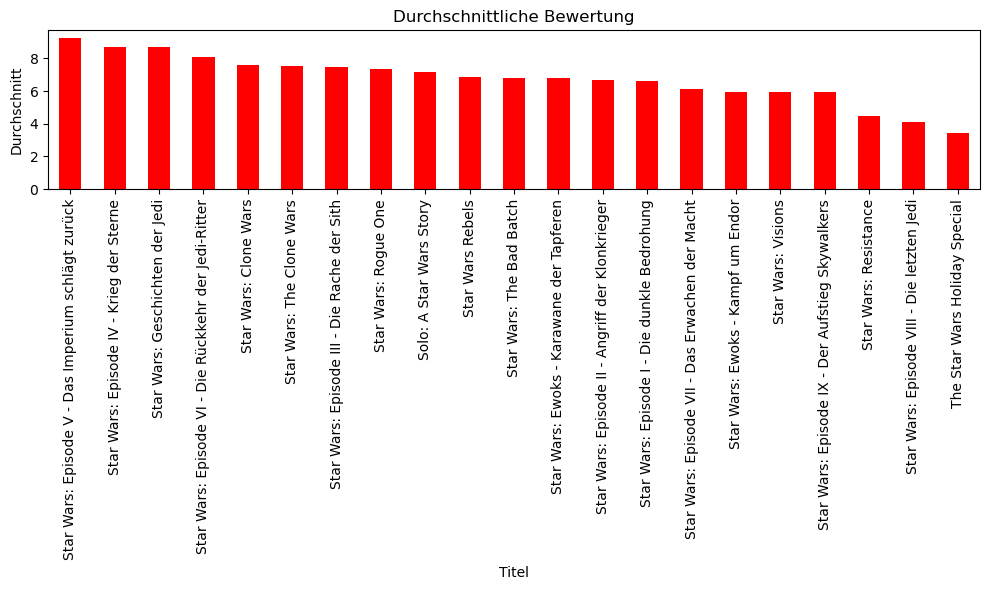

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

durchschnitt_pro_Film = StarWars.groupby('titel')['rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(10,6))
durchschnitt_pro_Film.plot(kind='bar', color='red')
plt.title('Durchschnittliche Bewertung')
plt.xlabel('Titel')
plt.ylabel('Durchschnitt')
plt.tight_layout()
plt.show()

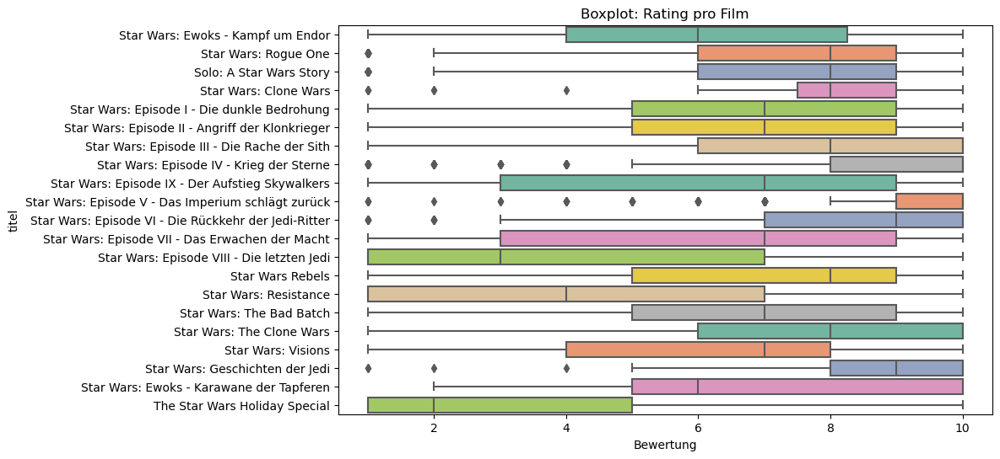

In [26]:
plt.figure(figsize=(10, 6))  
sns.boxplot(x='rating', y='titel', data=StarWars, orient='h', palette="Set2")

plt.title('Boxplot: Rating pro Film')
plt.xlabel('Bewertung')

plt.show()


#### Anzahl an Bewertungen nach Film

- am häufigsten bewertet: Star Wars: Episode IX - Der Aufstieg Skywalkers         (6064)
- am seltensten bewertet: Star Wars: Ewoks - Karawane der Tapferen                  (37)

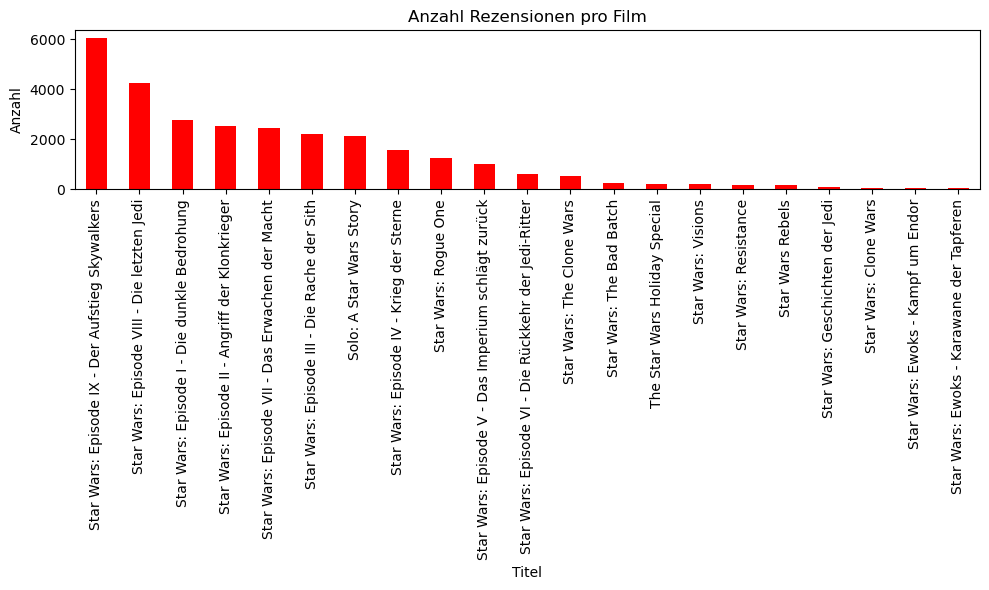

In [27]:
bewertungen_pro_Film = StarWars.groupby('titel')['review_id'].count().sort_values(ascending=False)

plt.figure(figsize=(10,6))
bewertungen_pro_Film.plot(kind='bar', color='red')
plt.title('Anzahl Rezensionen pro Film')
plt.xlabel('Titel')
plt.ylabel('Anzahl')
plt.tight_layout()
plt.show()


In [28]:
print(bewertungen_pro_Film)

titel
Star Wars: Episode IX - Der Aufstieg Skywalkers         6064
Star Wars: Episode VIII - Die letzten Jedi              4253
Star Wars: Episode I - Die dunkle Bedrohung             2783
Star Wars: Episode II - Angriff der Klonkrieger         2545
Star Wars: Episode VII - Das Erwachen der Macht         2449
Star Wars: Episode III - Die Rache der Sith             2206
Solo: A Star Wars Story                                 2136
Star Wars: Episode IV - Krieg der Sterne                1564
Star Wars: Rogue One                                    1255
Star Wars: Episode V - Das Imperium schlägt zurück       995
Star Wars: Episode VI - Die Rückkehr der Jedi-Ritter     618
Star Wars: The Clone Wars                                523
Star Wars: The Bad Batch                                 255
The Star Wars Holiday Special                            212
Star Wars: Visions                                       191
Star Wars: Resistance                                    167
Star Wars Rebels  

#### Anzahl an Ratings nach Sterne

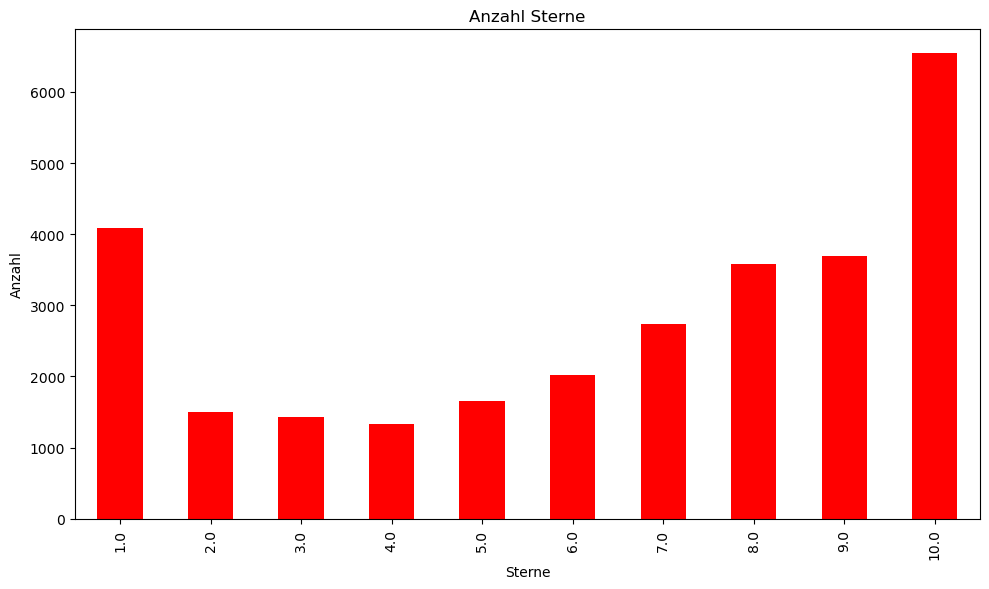

In [29]:
Anzahl_Sterne = StarWars.groupby('rating')['rating'].count()

plt.figure(figsize=(10,6))
Anzahl_Sterne.plot(kind='bar', color='red')
plt.title('Anzahl Sterne')
plt.xlabel('Sterne')
plt.ylabel('Anzahl')
plt.tight_layout()
plt.show()

#### Kategorien der einzelnen Filme
- insgesamt 7 verschiedene Kategoriezusammenstellungen
- Am häufigsten: Action, Adventure, Fantasy (8 Mal) -> von der Star Wars Saga nur Star Wars: Episode VII - Das Erwachen der Macht eine andere Kategorie zugeordnet

In [30]:
film_nach_kategorie = StarWars.groupby('titel')['kategorie'].unique()
print(film_nach_kategorie)

titel
Solo: A Star Wars Story                                    [Action, Adventure, Sci-Fi]
Star Wars Rebels                                        [Animation, Action, Adventure]
Star Wars: Clone Wars                                   [Animation, Action, Adventure]
Star Wars: Episode I - Die dunkle Bedrohung               [Action, Adventure, Fantasy]
Star Wars: Episode II - Angriff der Klonkrieger           [Action, Adventure, Fantasy]
Star Wars: Episode III - Die Rache der Sith               [Action, Abenteuer, Fantasy]
Star Wars: Episode IV - Krieg der Sterne                  [Action, Adventure, Fantasy]
Star Wars: Episode IX - Der Aufstieg Skywalkers           [Action, Adventure, Fantasy]
Star Wars: Episode V - Das Imperium schlägt zurück        [Action, Adventure, Fantasy]
Star Wars: Episode VI - Die Rückkehr der Jedi-Ritter      [Action, Adventure, Fantasy]
Star Wars: Episode VII - Das Erwachen der Macht            [Action, Adventure, Sci-Fi]
Star Wars: Episode VIII - Die letzten

In [31]:
kategorien = StarWars.groupby('kategorie').size().sort_values(ascending=False)

print(kategorien)


kategorie
Action, Adventure, Fantasy      18822
Action, Adventure, Sci-Fi        5840
Action, Abenteuer, Fantasy       2206
Animation, Action, Adventure     1161
Animation, Short, Action          280
Adventure, Family, Musical        212
Adventure, Family, Fantasy         77
dtype: int64


## Sentiment-Analyse
In der Literatur finden sich verschiedene Algorithmen, die sich in 4 Hauptkategorien einteilen lassen:
- Lexikon-basierte Ansätze
    - vordefinierte Wörter mit Sentiment-Werten -> jedes Wort wird entsprechend bewertet, die Summe bildet das Sentiment des Textes
    - z.B. VADER, TextBlob (tlw. lexikon-basierte Methoden)
    - für einfache Anwendungden effizient und schnell; eher für kurze Texte (z.B. Social-Media Posts oder Produktbewertungen)
- Maschinelles Lernen
    - nutzen Trainingsdaten (manuell annotiert) bzw. historische Daten um Modelle zu trainieren, die Sentiments basierend auf Features im Text vorhersagen
    - z.B. Naive Bayes, Random Forest, Support Vector Machines (SVM)
    -  erkennt komplexe Muster, flexibel
- Deep Learning
    - Neuronale Netze zur Extraktion von Sentiments aus Texten
    - z.B. Transformer-Modelle (u.a. BERT und GPT), Recurrent Neural Networks (RNN)
    - zur Erfassung tieferliegender Sprachstrukturen; große Mengen an Testdaten und Rechenleistung erforderlich
- Hybridansätze
    - Kombination aus zwei oder mehreren Ansätzen. 
    - Defizite der einzelnen Ansätze werden ausgeglichen


Entscheidungsfaktoren:
    - Datenverfügbarkeit: v.a. bei Deep Learning große Anzahl annotierter Trainingsdaten notwendig (z.B. Hugging Face)
    - Rechenressourcen
    - Anwendungskontext: Art und Länge der Texte
    - Anforderungen: z.B. Genauigkeit


Schritte:
1. Installieren der benötigten Bibliotheken
2. Vorverarbeitung der Daten: Tokenisieren, Stopwörter und überflüssige Zeichen entfernen (Achtung: Bei Vader nicht!)
3. Sentiment-Analyse durchführen: "TextBlob", "VADER", "Transformer"
4. Ergebnisse analysieren

---

### Textblob

Gibt 2 Werte zurück:

- Polarität: wie positiv oder negativ ist ein Text
- Subjektvität: misst wie subjektiv bzw. objektiv ein Text ist (faktischer vs. persönlicher Informationsgehalt)

Für unsere Zwecke vor allem Polarität interessant, da Meinungsanalyse


In [32]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from textblob import TextBlob 

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jojoh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jojoh\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [33]:
StarWars.head()

,ID,film_id,titel,jahr,kategorie,review_id,username,gesamtbewertung,rating,date,review_caption,bewertung
0,1,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9598497,alesterage,5.4,2.0,2024-02-01,A generic low-quality fantasy movie disguised ...,The title basically sums up everything you nee...
1,2,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9522494,rarepunkrock,5.4,7.0,2023-12-27,Bit of a Hidden Gem,"Somehow I missed this back in my childhood, wh..."
2,3,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9491218,pb93,5.4,5.0,2023-12-12,One for toddlers and completionists,"I'm currently in the process of trying to ""com..."
3,4,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9345213,adamjohns-42575,5.4,5.0,2023-09-27,Yubnub!,Ewoks: The Battle For Endor (1985) -Despite th...
4,5,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9249709,TBJCSKCNRRQTreviews,5.4,7.0,2023-08-10,"No, not her, she's evil!","When marauders attack, Cindel and Wicket are f..."


In [34]:
StarWars_Textblob=StarWars[['ID','review_id', 'titel','gesamtbewertung','rating','bewertung']].copy()

In [35]:
#beispiel_neg = StarWars_Textblob.loc[147,['bewertung', 'rating']]
#print(beispiel_neg)

In [36]:
#StarWars_Textblob['bewertung'] = StarWars_Textblob['bewertung'].str.replace(r'[^\w\s]', '', regex=True) # entfenern von Satzzeichen

In [37]:
def tokenize_bewertung(text):
    try:
        return nltk.word_tokenize(text)
    except TypeError:
        return []

def entferne_stoppwörter(tokens):
    stopp_wörter = set(stopwords.words('english'))
    gefilterte_tokens = [token for token in tokens if token.lower() not in stopp_wörter]
    return gefilterte_tokens




In [38]:
StarWars_Textblob['bewertung_tokens'] = StarWars_Textblob['bewertung'].apply(tokenize_bewertung)


In [39]:
StarWars_Textblob['bewertung_tokens'] = StarWars_Textblob['bewertung_tokens'].apply(entferne_stoppwörter)

In [40]:
beispiel = StarWars_Textblob['bewertung_tokens'][147]
print(beispiel)

['movie', 'along', 'lines', 'force', 'awakens', 'rise', 'skywalker', 'ugh', 'dare', 'say', 'last', 'jedi', 'dun', 'dun', 'dun', 'terrible', 'movies', 'rouge', 'one', 'awful', 'doesnt', 'feel', 'like', 'star', 'wars', 'bit', 'liked', 'darth', 'vader', 'everything', 'else', 'complete', 'waste', 'footage', '.']


In [41]:
#def sentiment_TextBlob(text): # Wortebene
 #   blob = TextBlob(text)
  #  polarity = blob.sentiment.polarity
   # return polarity

def sentiment_TextBlob_Satz(text): #Satzebene
    blob = TextBlob(text)
    polaritaet = [sentence.sentiment.polarity for sentence in blob.sentences]
    subjektivitaet = [sentence.sentiment.subjectivity for sentence in blob.sentences]
    if polaritaet:  
        durchsnitt_polaritaet = sum(polaritaet) / len(polaritaet)
    else:
        durchsnitt_polaritaet = 0

    if subjektivitaet:  
        durchsnitt_subjektvitaet = sum(subjektivitaet) / len(subjektivitaet)
    else:
        durchsnitt_subjektvitaet = 0

    return durchsnitt_polaritaet, durchsnitt_subjektvitaet



In [42]:
#StarWars_Textblob['sentiment_textblob_wortebene'] = StarWars_Textblob['bewertung'].apply(sentiment_TextBlob)

In [43]:
StarWars_Textblob[['textblob_polaritaet', 'textblob_subjektivitaet']] = StarWars_Textblob['bewertung'].apply(lambda x: pd.Series(sentiment_TextBlob_Satz(x)))

In [44]:
StarWars_Textblob.head(50)

,ID,review_id,titel,gesamtbewertung,rating,bewertung,bewertung_tokens,textblob_polaritaet,textblob_subjektivitaet
0,1,rw9598497,Star Wars: Ewoks - Kampf um Endor,5.4,2.0,The title basically sums up everything you nee...,"[title, basically, sums, everything, need, kno...",0.032857,0.341270
1,2,rw9522494,Star Wars: Ewoks - Kampf um Endor,5.4,7.0,"Somehow I missed this back in my childhood, wh...","[Somehow, missed, back, childhood, ,, bizarre,...",0.111667,0.522667
2,3,rw9491218,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,"I'm currently in the process of trying to ""com...","['m, currently, process, trying, ``, complete,...",0.130689,0.526567
3,4,rw9345213,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,Ewoks: The Battle For Endor (1985) -Despite th...,"[Ewoks, :, Battle, Endor, (, 1985, ), -Despite...",0.149666,0.550924
4,5,rw9249709,Star Wars: Ewoks - Kampf um Endor,5.4,7.0,"When marauders attack, Cindel and Wicket are f...","[marauders, attack, ,, Cindel, Wicket, forced,...",0.170635,0.384436
5,6,rw8951260,Star Wars: Ewoks - Kampf um Endor,5.4,9.0,An epic on par with homers odyssey and the Ili...,"[epic, par, homers, odyssey, Iliad, ,, think, ...",0.156293,0.338322
6,7,rw8383408,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,"On the planet Endor, Cindel (Aubree Miller) an...","[planet, Endor, ,, Cindel, (, Aubree, Miller, ...",0.062109,0.489753
7,8,rw8303732,Star Wars: Ewoks - Kampf um Endor,5.4,6.0,"1984's Ewok movie, Caravan of Courage proved t...","[1984, 's, Ewok, movie, ,, Caravan, Courage, p...",0.181739,0.476011
8,9,rw7952717,Star Wars: Ewoks - Kampf um Endor,5.4,6.0,Ewoks: The Battle for Endor. The adventure con...,"[Ewoks, :, Battle, Endor, ., adventure, contin...",0.169167,0.360000
9,10,rw7617949,Star Wars: Ewoks - Kampf um Endor,5.4,1.0,"Awful on every level. Costumes, story, effects...","[Awful, every, level, ., Costumes, ,, story, ,...",-0.190972,0.253472


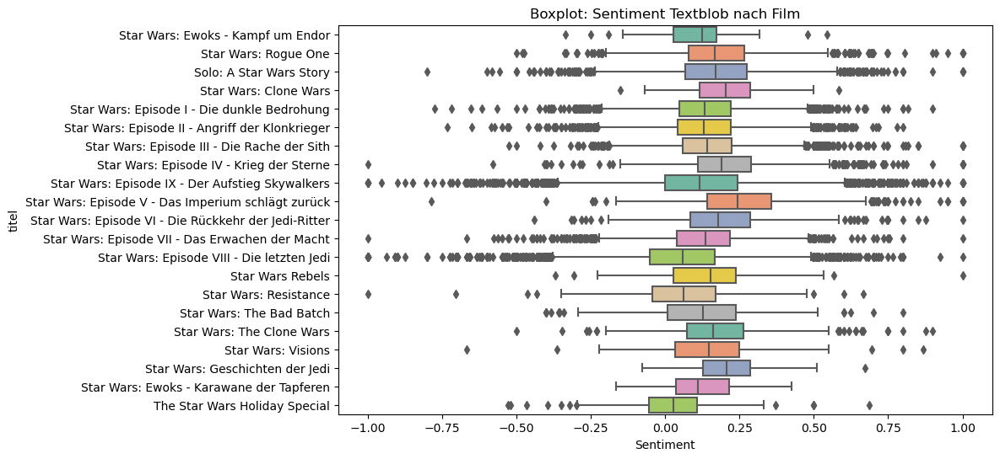

In [45]:
plt.figure(figsize=(10, 6))  
sns.boxplot(x='textblob_polaritaet', y='titel', data=StarWars_Textblob, orient='h', palette="Set2")

plt.title('Boxplot: Sentiment Textblob nach Film')
plt.xlabel('Sentiment')

plt.show()

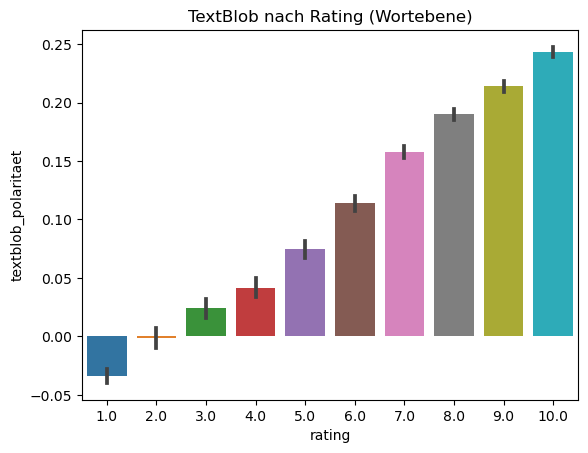

In [46]:
ax = sns.barplot(data=StarWars_Textblob, x = 'rating', y='textblob_polaritaet')
ax.set_title('TextBlob nach Rating (Wortebene)')
plt.show()

In [47]:
aureißer_neg = StarWars_Textblob.loc[StarWars_Textblob['textblob_polaritaet'] < 0]

aureißer_pos = StarWars_Textblob.loc[StarWars_Textblob['textblob_polaritaet'] > 0]

In [48]:
korrelation_neg = aureißer_neg['rating'].corr(aureißer_neg['textblob_polaritaet'])
korrelation_pos = aureißer_pos['rating'].corr(aureißer_pos['textblob_polaritaet'])
print(korrelation_neg)
print(korrelation_pos)

0.22507354657850948
0.35696889400412446


In [49]:

rating_zehn_datensaetze = StarWars.loc[StarWars['rating'] == 1]
ids_zehn = rating_zehn_datensaetze['ID'].tolist()
print(ids_zehn)

['10', '27', '29', '33', '34', '142', '148', '163', '237', '259', '268', '367', '396', '444', '449', '479', '481', '487', '509', '512', '515', '522', '525', '553', '555', '557', '562', '568', '585', '593', '599', '603', '619', '627', '639', '640', '650', '655', '662', '676', '695', '707', '708', '709', '722', '749', '750', '752', '759', '764', '768', '806', '811', '860', '894', '909', '928', '936', '938', '953', '969', '1010', '1024', '1069', '1110', '1128', '1136', '1164', '1171', '1268', '1288', '1301', '1321', '1340', '1343', '1377', '1384', '1394', '1446', '1451', '1463', '1504', '1509', '1511', '1538', '1551', '1566', '1576', '1578', '1583', '1630', '1637', '1642', '1657', '1660', '1668', '1678', '1684', '1734', '1736', '1738', '1743', '1757', '1788', '1800', '1856', '1861', '1879', '1933', '1943', '1956', '1962', '1985', '2003', '2024', '2028', '2044', '2063', '2094', '2099', '2108', '2112', '2118', '2119', '2149', '2188', '2202', '2205', '2207', '2208', '2213', '2220', '2223', '

In [50]:
beispiel_pos = StarWars_Textblob.loc[154,['bewertung', 'rating', 'textblob_polaritaet']]

if isinstance(beispiel_pos['bewertung'], list):
    gesamter_text = ' '.join(beispiel_pos['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_pos['bewertung'])

print("Rating:", beispiel_pos['rating'])
print("Sentiment:" , beispiel_pos['textblob_polaritaet'])

Bewertung: Rogue One is an all-new epic adventure directed by Gareth Edwards and written by Chris Weitz and Tony Gilroy. In a time of conflict, a group of unlikely heroes band together on a mission to steal the plans to the Death Star, the Empire's ultimate weapon of destruction. But this film is so much more than a prequel to A New Hope which revolves around the Rebellion trying to destroy the Death Star. With well written, morally grey and likeable characters, but also lots of characters from the prequel trilogy and the Clone Wars tv show; like Bail Organa, Mon Mothma, Saw Gerrera, Vader, Tarkin and a bunch of cameos. But it's the new ones that leaves a mark; characters like Jyn Erso, Cassian Andor, Orson Krennic, Galen Erso and K-2SO. The main cast consists of Felicity Jones, Diego Luna, Ben Mendelsohn, Donnie Yen, Mads Mikkelsen, Alan Tudyk, Forest Whitaker, Riz Ahmed and Jiang Wen.Rogue One: A Star Wars story is Star Wars at its best because of many things, there's plenty of tensi

In [51]:
beispiel_neu = StarWars_Textblob.loc[142,['bewertung', 'rating', 'textblob_polaritaet']]

if isinstance(beispiel_neu['bewertung'], list):
    gesamter_text = ' '.join(beispiel_pos['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_neu['bewertung'])

print("Rating:", beispiel_neu['rating'])
print("Sentiment:" , beispiel_neu['textblob_polaritaet'])

Bewertung: This could have been an exciting story given that in the original Star Wars there was some mystery and build up behind the stealing of the plans and that's what this should have been. It should have been a journey and a race against time between the Rebellion and the Empire. Maybe even make it Star Wars' version of The Dirty Dozen. But sadly it wasn't. It takes too long to get to the main point of the story which is to steal the plans. Speaking of that the whole Galen Erso plot totally negates to me what happened in Star Wars. The idea was to analyze the plans to see if there is a weakness and if there was a way to destroy the Death Star. However Galen done that for them so there was no point to trying to see if they could destroy the Death Star because they knew they could with the right shot. By doing that you took away the suspense of whether or not the Rebellion could triumph. All in all what could have been a great suspenseful story was just average.
Rating: 5.0
Sentime

In [52]:
 beispiel_neg = StarWars_Textblob.loc[147,['bewertung', 'rating', 'textblob_polaritaet']]

if isinstance(beispiel_neg['bewertung'], list):
    gesamter_text = ' '.join(beispiel_neg['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_neg['bewertung'])

print("Rating:", beispiel_neg['rating'])
print("Sentiment:" , beispiel_neg['textblob_polaritaet'])

Bewertung: This movie is along the lines of force awakens rise of skywalker ugh dare i say it last jedi dun dun dun all terrible movies rouge one is just awful it doesnt feel like star wars the bit only i liked was darth vader but everything else just was a complete waste of footage.
Rating: 1.0
Sentiment: -0.21428571428571425


In [53]:
korrelation = StarWars_Textblob['textblob_polaritaet'].corr(StarWars_Textblob['rating']) # pearson Korrelation als default
print(korrelation)

0.5207003534342732


In [54]:
korrelation = StarWars_Textblob['textblob_subjektivitaet'].corr(StarWars_Textblob['rating']) # pearson Korrelation als default
print(korrelation)

0.07498798497292233


---

### Vader

- Valence Aware Dictionary and sEntiment Reasoner
- Analysiert Texte mit Interpunktion und typischer Struktur von Online-Texten, also in urpsürnglicher Form -> keine Stoppwörter etc. dürfen entfernt werde; nutzt z.B. Verstärkerwörter ("sehr")

**Vader vs. TextBlob:**

Vader: 

- Optimiert für Social Media-Sprache (einschl. Slangs, Emoticons, Akronyme) bzw. Internet-spezifische Ausdrucksweisen
- gibt neben negativ, neutral und positiv noch einen compound Wert aus. Dieser entspricht der Intensität des Sentiments
- vorab trainiertes Modell -> benutzerfreundlich und schnell
- Fokus auf Effizienz -> für Echtzeitanalyse ebenfalls  sinnvoll 
    
TextBlob:

- eher allgemeinere Sentimentanalyse (nicht ausgerichtet auf Social Media)
- berechnet Polarität (wie pos. oder neg. ein Text ist), aber keine Messung der Intensität
- erfordert keine Trainingsphase, breitere Anwendung abe rnicht so spezialisiert
- allgemeine Natur und breite Funktionalität können zu Unterschieden in Verarbeitungsgeschwindigkeit führen



In [55]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\jojoh\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [56]:
StarWars_Vader=StarWars[['ID','review_id', 'titel','gesamtbewertung','rating','bewertung']].copy()

In [57]:
def sentiment_VADER(text):
    sentiment_vader = sia.polarity_scores(text)
    return sentiment_vader

In [58]:
StarWars_Vader[['vader_neg', 'vader_neu', 'vader_pos', 'vader_compound']] = StarWars_Vader['bewertung'].apply(lambda x: pd.Series(sentiment_VADER(x)))

In [59]:
StarWars_Vader.head(140)

,ID,review_id,titel,gesamtbewertung,rating,bewertung,vader_neg,vader_neu,vader_pos,vader_compound
0,1,rw9598497,Star Wars: Ewoks - Kampf um Endor,5.4,2.0,The title basically sums up everything you nee...,0.092,0.848,0.060,-0.4964
1,2,rw9522494,Star Wars: Ewoks - Kampf um Endor,5.4,7.0,"Somehow I missed this back in my childhood, wh...",0.086,0.754,0.161,0.8809
2,3,rw9491218,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,"I'm currently in the process of trying to ""com...",0.139,0.698,0.163,0.5923
3,4,rw9345213,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,Ewoks: The Battle For Endor (1985) -Despite th...,0.046,0.799,0.156,0.9897
4,5,rw9249709,Star Wars: Ewoks - Kampf um Endor,5.4,7.0,"When marauders attack, Cindel and Wicket are f...",0.099,0.652,0.249,0.9890
...,...,...,...,...,...,...,...,...,...,...
147,148,rw8027959,Star Wars: Rogue One,7.8,1.0,This movie is along the lines of force awakens...,0.227,0.741,0.032,-0.8626
148,149,rw8019077,Star Wars: Rogue One,7.8,10.0,When i was watching it for first time i turned...,0.137,0.700,0.163,0.7308
149,150,rw7944918,Star Wars: Rogue One,7.8,7.0,This is a solid sci fi film that exists in the...,0.064,0.862,0.074,0.1779
150,151,rw7942445,Star Wars: Rogue One,7.8,8.0,This might be the first movie from the Star Wa...,0.058,0.942,0.000,-0.5574


In [60]:
beispiel_pos = StarWars_Vader.loc[154,['bewertung', 'rating', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound']]

if isinstance(beispiel_pos['bewertung'], list):
    gesamter_text = ' '.join(beispiel_pos['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_pos['bewertung'])

print("Rating:", beispiel_pos['rating'])
print("neg:" , beispiel_pos['vader_neg'],"neu:" , beispiel_pos['vader_neu'],"pos:" , beispiel_pos['vader_pos'],"compound:" , beispiel_pos['vader_compound'])

Bewertung: Rogue One is an all-new epic adventure directed by Gareth Edwards and written by Chris Weitz and Tony Gilroy. In a time of conflict, a group of unlikely heroes band together on a mission to steal the plans to the Death Star, the Empire's ultimate weapon of destruction. But this film is so much more than a prequel to A New Hope which revolves around the Rebellion trying to destroy the Death Star. With well written, morally grey and likeable characters, but also lots of characters from the prequel trilogy and the Clone Wars tv show; like Bail Organa, Mon Mothma, Saw Gerrera, Vader, Tarkin and a bunch of cameos. But it's the new ones that leaves a mark; characters like Jyn Erso, Cassian Andor, Orson Krennic, Galen Erso and K-2SO. The main cast consists of Felicity Jones, Diego Luna, Ben Mendelsohn, Donnie Yen, Mads Mikkelsen, Alan Tudyk, Forest Whitaker, Riz Ahmed and Jiang Wen.Rogue One: A Star Wars story is Star Wars at its best because of many things, there's plenty of tensi

In [61]:
beispiel_neu = StarWars_Vader.loc[142,['bewertung', 'rating', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound']]

if isinstance(beispiel_neu['bewertung'], list):
    gesamter_text = ' '.join(beispiel_neu['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_neu['bewertung'])

print("Rating:", beispiel_neu['rating'])
print("neg:" , beispiel_neu['vader_neg'],"neu:" , beispiel_neu['vader_neu'],"pos:" , beispiel_neu['vader_pos'],"compound:" , beispiel_neu['vader_compound'])

Bewertung: This could have been an exciting story given that in the original Star Wars there was some mystery and build up behind the stealing of the plans and that's what this should have been. It should have been a journey and a race against time between the Rebellion and the Empire. Maybe even make it Star Wars' version of The Dirty Dozen. But sadly it wasn't. It takes too long to get to the main point of the story which is to steal the plans. Speaking of that the whole Galen Erso plot totally negates to me what happened in Star Wars. The idea was to analyze the plans to see if there is a weakness and if there was a way to destroy the Death Star. However Galen done that for them so there was no point to trying to see if they could destroy the Death Star because they knew they could with the right shot. By doing that you took away the suspense of whether or not the Rebellion could triumph. All in all what could have been a great suspenseful story was just average.
Rating: 5.0
neg: 0.

In [62]:
beispiel_neg = StarWars_Vader.loc[147,['bewertung', 'rating', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound']]

if isinstance(beispiel_neg['bewertung'], list):
    gesamter_text = ' '.join(beispiel_neg['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_neg['bewertung'])

print("Rating:", beispiel_neg['rating'])
print("neg:" , beispiel_neg['vader_neg'],"neu:" , beispiel_neg['vader_neu'],"pos:" , beispiel_neg['vader_pos'],"compound:" , beispiel_neg['vader_compound'])

Bewertung: This movie is along the lines of force awakens rise of skywalker ugh dare i say it last jedi dun dun dun all terrible movies rouge one is just awful it doesnt feel like star wars the bit only i liked was darth vader but everything else just was a complete waste of footage.
Rating: 1.0
neg: 0.227 neu: 0.741 pos: 0.032 compound: -0.8626


In [63]:
nan_count = StarWars_Vader.isna().sum()
print(nan_count)

ID                 0
review_id          0
titel              0
gesamtbewertung    0
rating             0
bewertung          0
vader_neg          0
vader_neu          0
vader_pos          0
vader_compound     0
dtype: int64


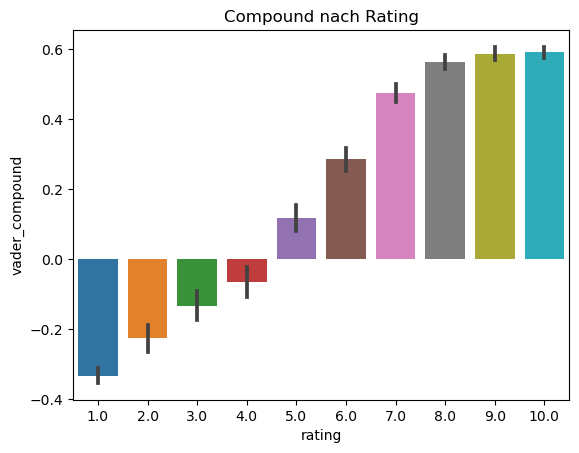

In [64]:
ax = sns.barplot(data=StarWars_Vader, x = 'rating', y='vader_compound')
ax.set_title('Compound nach Rating')
plt.show()

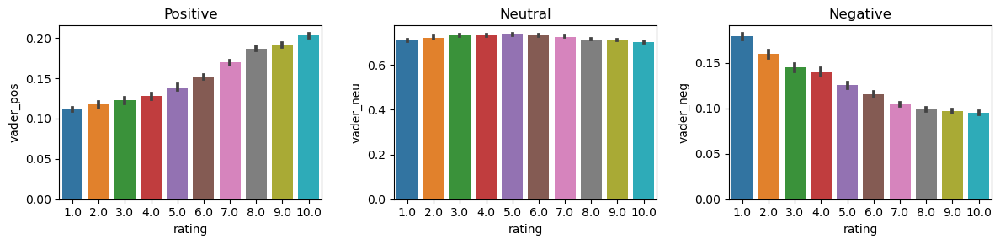

In [65]:
fig, axs = plt.subplots(1, 3, figsize=(12, 3))
sns.barplot(data=StarWars_Vader, x='rating', y='vader_pos', ax=axs[0])
sns.barplot(data=StarWars_Vader, x='rating', y='vader_neu', ax=axs[1])
sns.barplot(data=StarWars_Vader, x='rating', y='vader_neg', ax=axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

In [66]:
korrelation = StarWars_Vader['vader_compound'].corr(StarWars_Vader['rating']) # pearson Korrelation als default
print(korrelation)

0.4630616645778429


---

### Roberta Pretrained Model: Self-Supervised Learning Ansatz

Zugriff auf vortrainierte Modelle über HuggingFace 🤗: https://doi.org/10.48550/arXiv.2202.03829

- Robustly optimized BERT approach (Weiterentwicklung von BERT), gehört zu den Transformer-Modelle -->Verstehen Wörter im Kontext ihrer Verwendung
- u.a. für Named Entitiy Recocgnition, Sentiment-Analyse, Textklassifikation
- Vorteile: Felxibilität und erhöhte Genauigkeit  

Problem: kann maximal 512 Token verarbeiten, weshalb evtl. nicht jede Bwertung vollständig analysiert wurde -> es könnte relevanter Kontext verloren gegangen sein. Insgesamt weisen die Daten bei 2745 Fällen mehr als 512 Token auf 

In [67]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax
from transformers import RobertaTokenizer
from tqdm import tqdm
tqdm.pandas()


In [68]:
# Laden des vortrainierten Sentiment-Modells
sentiment_model = f"cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(sentiment_model)
model = AutoModelForSequenceClassification.from_pretrained(sentiment_model)

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [69]:
StarWars_Roberta=StarWars[['ID','review_id', 'titel','gesamtbewertung','rating','bewertung']].copy()

In [70]:
StarWars_Roberta.head(140)

,ID,review_id,titel,gesamtbewertung,rating,bewertung
0,1,rw9598497,Star Wars: Ewoks - Kampf um Endor,5.4,2.0,The title basically sums up everything you nee...
1,2,rw9522494,Star Wars: Ewoks - Kampf um Endor,5.4,7.0,"Somehow I missed this back in my childhood, wh..."
2,3,rw9491218,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,"I'm currently in the process of trying to ""com..."
3,4,rw9345213,Star Wars: Ewoks - Kampf um Endor,5.4,5.0,Ewoks: The Battle For Endor (1985) -Despite th...
4,5,rw9249709,Star Wars: Ewoks - Kampf um Endor,5.4,7.0,"When marauders attack, Cindel and Wicket are f..."
...,...,...,...,...,...,...
147,148,rw8027959,Star Wars: Rogue One,7.8,1.0,This movie is along the lines of force awakens...
148,149,rw8019077,Star Wars: Rogue One,7.8,10.0,When i was watching it for first time i turned...
149,150,rw7944918,Star Wars: Rogue One,7.8,7.0,This is a solid sci fi film that exists in the...
150,151,rw7942445,Star Wars: Rogue One,7.8,8.0,This might be the first movie from the Star Wa...


In [71]:
def sentiment_Roberta(text):
    encoded_text = tokenizer(text, return_tensors='pt', padding=True,  truncation=True, max_length=512)
    output = model(**encoded_text)
    scores = output.logits[0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg': scores[0],
        'roberta_neu': scores[1],
        'roberta_pos': scores[2]
    }
    return scores_dict

In [72]:
test_df = StarWars_Roberta.loc[[142,147,154]]
test_df[['roberta_neg','roberta_neu','roberta_pos']] = test_df['bewertung'].progress_apply(lambda x: pd.Series(sentiment_Roberta(x)))

100%|██████████| 3/3 [00:48<00:00, 16.16s/it]


In [73]:
beispiel_neg = test_df.loc[147,['bewertung', 'rating', 'roberta_neg', 'roberta_neu', 'roberta_pos']]

if isinstance(beispiel_neg['bewertung'], list):
    gesamter_text = ' '.join(beispiel_neg['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_neg['bewertung'])

print("Rating:", beispiel_neg['rating'])
print("neg:" , beispiel_neg['roberta_neg'],"neu:" , beispiel_neg['roberta_neu'],"pos:" , beispiel_neg['roberta_pos'])

Bewertung: This movie is along the lines of force awakens rise of skywalker ugh dare i say it last jedi dun dun dun all terrible movies rouge one is just awful it doesnt feel like star wars the bit only i liked was darth vader but everything else just was a complete waste of footage.
Rating: 1.0
neg: 0.9430845 neu: 0.049416244 pos: 0.0074992822


In [74]:
beispiel_neu = test_df.loc[142,['bewertung', 'rating', 'roberta_neg', 'roberta_neu', 'roberta_pos']]

if isinstance(beispiel_neu['bewertung'], list):
    gesamter_text = ' '.join(beispiel_neu['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_neu['bewertung'])

print("Rating:", beispiel_neu['rating'])
print("neg:" , beispiel_neu['roberta_neg'],"neu:" , beispiel_neu['roberta_neu'],"pos:" , beispiel_neu['roberta_pos'])

Bewertung: This could have been an exciting story given that in the original Star Wars there was some mystery and build up behind the stealing of the plans and that's what this should have been. It should have been a journey and a race against time between the Rebellion and the Empire. Maybe even make it Star Wars' version of The Dirty Dozen. But sadly it wasn't. It takes too long to get to the main point of the story which is to steal the plans. Speaking of that the whole Galen Erso plot totally negates to me what happened in Star Wars. The idea was to analyze the plans to see if there is a weakness and if there was a way to destroy the Death Star. However Galen done that for them so there was no point to trying to see if they could destroy the Death Star because they knew they could with the right shot. By doing that you took away the suspense of whether or not the Rebellion could triumph. All in all what could have been a great suspenseful story was just average.
Rating: 5.0
neg: 0.

In [75]:
beispiel_pos = test_df.loc[154,['bewertung', 'rating', 'roberta_neg', 'roberta_neu', 'roberta_pos']]

if isinstance(beispiel_pos['bewertung'], list):
    gesamter_text = ' '.join(beispiel_pos['bewertung'])
    print("Bewertung als Text:", gesamter_text)
else:
    print("Bewertung:", beispiel_pos['bewertung'])

print("Rating:", beispiel_pos['rating'])
print("neg:" , beispiel_pos['roberta_neg'],"neu:" , beispiel_pos['roberta_neu'],"pos:" , beispiel_pos['roberta_pos'])

Bewertung: Rogue One is an all-new epic adventure directed by Gareth Edwards and written by Chris Weitz and Tony Gilroy. In a time of conflict, a group of unlikely heroes band together on a mission to steal the plans to the Death Star, the Empire's ultimate weapon of destruction. But this film is so much more than a prequel to A New Hope which revolves around the Rebellion trying to destroy the Death Star. With well written, morally grey and likeable characters, but also lots of characters from the prequel trilogy and the Clone Wars tv show; like Bail Organa, Mon Mothma, Saw Gerrera, Vader, Tarkin and a bunch of cameos. But it's the new ones that leaves a mark; characters like Jyn Erso, Cassian Andor, Orson Krennic, Galen Erso and K-2SO. The main cast consists of Felicity Jones, Diego Luna, Ben Mendelsohn, Donnie Yen, Mads Mikkelsen, Alan Tudyk, Forest Whitaker, Riz Ahmed and Jiang Wen.Rogue One: A Star Wars story is Star Wars at its best because of many things, there's plenty of tensi

In [76]:
#StarWars_Roberta[['roberta_neg','roberta_neu','roberta_pos']] = StarWars_Roberta['bewertung'].progress_apply(lambda x: pd.Series(sentiment_Roberta(x)))
#StarWars_Roberta.to_csv('StarWars_Roberta.csv', index=False)

In [77]:
StarWars_Roberta=pd.read_csv('StarWars_Roberta.csv', sep=',', header=0)
StarWars_Roberta.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28598 entries, 0 to 28597
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               28598 non-null  int64  
 1   review_id        28598 non-null  object 
 2   titel            28598 non-null  object 
 3   gesamtbewertung  28598 non-null  float64
 4   rating           28598 non-null  float64
 5   bewertung        28598 non-null  object 
 6   roberta_neg      28598 non-null  float64
 7   roberta_neu      28598 non-null  float64
 8   roberta_pos      28598 non-null  float64
dtypes: float64(5), int64(1), object(3)
memory usage: 2.0+ MB


In [78]:
nan_count = StarWars_Roberta.isna().sum()
print(nan_count)

ID                 0
review_id          0
titel              0
gesamtbewertung    0
rating             0
bewertung          0
roberta_neg        0
roberta_neu        0
roberta_pos        0
dtype: int64


In [79]:
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')

def tokenize_roberta(text):
    tokens = tokenizer.tokenize(text)
    return tokens



In [80]:
StarWars_Roberta['roberta_tokens'] = StarWars_Roberta['bewertung'].apply(tokenize_roberta)
StarWars_Roberta['anzahl_token'] = StarWars_Roberta['roberta_tokens'].apply(len)

mehr_als_512 = StarWars_Roberta.loc[StarWars_Roberta['anzahl_token'] > 512]
mehr_als_512.count()


ID                 2747
review_id          2747
titel              2747
gesamtbewertung    2747
rating             2747
bewertung          2747
roberta_neg        2747
roberta_neu        2747
roberta_pos        2747
roberta_tokens     2747
anzahl_token       2747
dtype: int64

---

### Zusammenfügen der Datensätze

In [81]:
StarWars_Textblob_red = StarWars_Textblob[['review_id', 'bewertung_tokens','textblob_polaritaet', 'textblob_subjektivitaet']]
StarWars_Vader_red = StarWars_Vader[['review_id','vader_neg','vader_neu','vader_pos','vader_compound']]
StarWars_Roberta_red = StarWars_Roberta[['review_id','roberta_neg','roberta_neu','roberta_pos']]

StarWars_Gesamt = pd.merge(StarWars, StarWars_Textblob_red, on='review_id', how='inner')
StarWars_Gesamt = pd.merge(StarWars_Gesamt, StarWars_Vader_red, on='review_id', how='inner')
StarWars_Gesamt = pd.merge(StarWars_Gesamt, StarWars_Roberta_red, on='review_id', how='inner')

In [82]:
StarWars_Gesamt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28598 entries, 0 to 28597
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ID                       28598 non-null  object        
 1   film_id                  28598 non-null  object        
 2   titel                    28598 non-null  object        
 3   jahr                     28598 non-null  object        
 4   kategorie                28598 non-null  object        
 5   review_id                28598 non-null  object        
 6   username                 28598 non-null  object        
 7   gesamtbewertung          28598 non-null  float64       
 8   rating                   28598 non-null  float64       
 9   date                     28598 non-null  datetime64[ns]
 10  review_caption           28598 non-null  object        
 11  bewertung                28598 non-null  object        
 12  bewertung_tokens         28598 n

In [83]:
nan_count = StarWars_Gesamt.isna().sum()
print(nan_count)

ID                         0
film_id                    0
titel                      0
jahr                       0
kategorie                  0
review_id                  0
username                   0
gesamtbewertung            0
rating                     0
date                       0
review_caption             0
bewertung                  0
bewertung_tokens           0
textblob_polaritaet        0
textblob_subjektivitaet    0
vader_neg                  0
vader_neu                  0
vader_pos                  0
vader_compound             0
roberta_neg                0
roberta_neu                0
roberta_pos                0
dtype: int64


In [84]:
StarWars_Gesamt.head()

,ID,film_id,titel,jahr,kategorie,review_id,username,gesamtbewertung,rating,date,...,bewertung_tokens,textblob_polaritaet,textblob_subjektivitaet,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos
0,1,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9598497,alesterage,5.4,2.0,2024-02-01,...,"[title, basically, sums, everything, need, kno...",0.032857,0.341270,0.092,0.848,0.060,-0.4964,0.613927,0.311481,0.074592
1,2,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9522494,rarepunkrock,5.4,7.0,2023-12-27,...,"[Somehow, missed, back, childhood, ,, bizarre,...",0.111667,0.522667,0.086,0.754,0.161,0.8809,0.025831,0.138740,0.835430
2,3,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9491218,pb93,5.4,5.0,2023-12-12,...,"['m, currently, process, trying, ``, complete,...",0.130689,0.526567,0.139,0.698,0.163,0.5923,0.676146,0.277843,0.046011
3,4,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9345213,adamjohns-42575,5.4,5.0,2023-09-27,...,"[Ewoks, :, Battle, Endor, (, 1985, ), -Despite...",0.149666,0.550924,0.046,0.799,0.156,0.9897,0.569818,0.384397,0.045785
4,5,tt0089110,Star Wars: Ewoks - Kampf um Endor,1985,"Adventure, Family, Fantasy",rw9249709,TBJCSKCNRRQTreviews,5.4,7.0,2023-08-10,...,"[marauders, attack, ,, Cindel, Wicket, forced,...",0.170635,0.384436,0.099,0.652,0.249,0.9890,0.136534,0.421554,0.441912


---

### Word-Cloud

zur Erstellung einer Word-CLoud muss der Text bereinigt werden: Stoppwörter entfernen, Satzzeichen entfernen, Lematisierung

In [100]:
#pip install spacy
#python -m spacy download en_core_web_sm
#pip install wordcloud

import spacy
from spacy.lang.en.stop_words import STOP_WORDS
import string

import numpy as np
from PIL import Image

from nltk import bigrams
from nltk.tokenize import word_tokenize
from collections import Counter


nlp = spacy.load("en_core_web_sm") #spaCy Modell 
nlp.max_length = 15000000
from wordcloud import WordCloud
import PIL.Image


In [91]:
stoppwörter = list(STOP_WORDS)
satzzeichen = string.punctuation

def text_bereinigen(text):
    doc = nlp(text)
    tokens = [token.text.lower().strip() for token in doc if token.text.lower().strip() not in stoppwörter and token.text not in satzzeichen]
    return " ".join(tokens)

def nur_adjektive(text):
    doc = nlp(text)
    adjektive = [token.text for token in doc if token.pos_ == "ADJ"]
    return adjektive

def nur_nomen(text):
    doc = nlp(text)
    nomen = [token.text for token in doc if token.pos_ == "NOUN"]
    return nomen

In [ ]:
#StarWars_WordCloud=StarWars_Gesamt[['ID','titel', 'kategorie', 'bewertung']].copy()

In [ ]:
#StarWars_WordCloud['bewertung'] = StarWars_WordCloud['bewertung'].progress_apply(lambda x: pd.Series(text_bereinigen(x)))
#StarWars_WordCloud.head()

In [ ]:
#StarWars_Gesamt['adjektive'] = StarWars_Gesamt['bewertung'].progress_apply(nur_adjektive)

In [ ]:
#StarWars_Gesamt['nomen'] = StarWars_Gesamt['bewertung'].progress_apply(nur_nomen)

In [ ]:
#StarWars_Gesamt.head()

In [ ]:
#StarWars_Gesamt.to_csv('StarWars_WordCloud.csv', index=False)

In [88]:
StarWars_Wordcloud=pd.read_csv('StarWars_WordCloud.csv', sep=',', header=0)
StarWars_Wordcloud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28598 entries, 0 to 28597
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       28598 non-null  int64  
 1   film_id                  28598 non-null  object 
 2   titel                    28598 non-null  object 
 3   jahr                     28598 non-null  int64  
 4   kategorie                28598 non-null  object 
 5   review_id                28598 non-null  object 
 6   username                 28598 non-null  object 
 7   gesamtbewertung          28598 non-null  float64
 8   rating                   28598 non-null  float64
 9   date                     28598 non-null  object 
 10  review_caption           28597 non-null  object 
 11  bewertung                28598 non-null  object 
 12  bewertung_tokens         28598 non-null  object 
 13  textblob_polaritaet      28598 non-null  float64
 14  textblob_subjektivitae

In [92]:
EpisodeV = StarWars_Wordcloud.loc[StarWars_Wordcloud['titel'] == 'Star Wars: Episode V - Das Imperium schlägt zurück']
gesamter_text = EpisodeV['bewertung'].str.cat(sep=' ')

EpisodeV_text= text_bereinigen(gesamter_text)

In [94]:
print(EpisodeV_text)

yes star wars film smash hit forgotten continued bunch rushed lazy written mediocre movies thankfully fact second entry lucas sciene fantasy saga universally seen better great movie rightfully expands world building massively character development basic point course effects action scenes look dated hurt viewing experience valid criticism think middle trilogy work obviously watch movies order enjoy star wars supposed young people 80s old generation generation boomers dark generation boomer perspective previous generation possess cool gear cars farms entrenched views star wars terms possessions translate ats tie fighters star destroyers fair george lucas lot brutal equiped dark actual tanks walking turrets bomber jets 80s kids told boomers older generations cut open empire came wondered lucas recreate magic movie follow new hope good ways exceeded original vfx technology improved importantly darker complex script told great story watching movie today unfortunately battle scenes ice plane

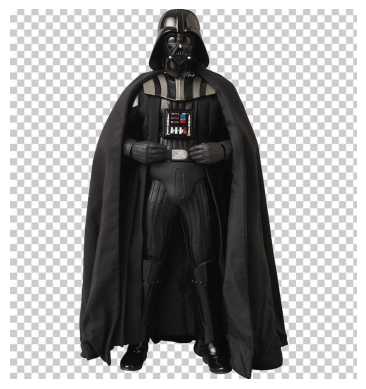

In [124]:
vader6 = np.array(Image.open('Vader6.jpg'))

plt.imshow(vader6)
plt.axis('off') # Schaltet die Achsenbeschriftung aus
plt.show()

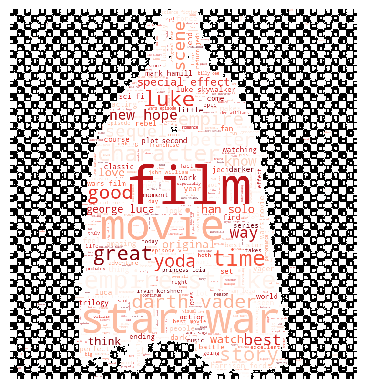

In [145]:


# Erstellen der WordCloud
wc = WordCloud(background_color="white", max_words=600, mask=vader6,
                contour_width=2,contour_color='black', colormap = 'Reds',width = 800, height = 500)

# Generieren der WordCloud
wc.generate(EpisodeV_text)

# Anzeigen der WordCloud

plt.imshow(wc, interpolation='nearest')
plt.axis("off")
plt.show()

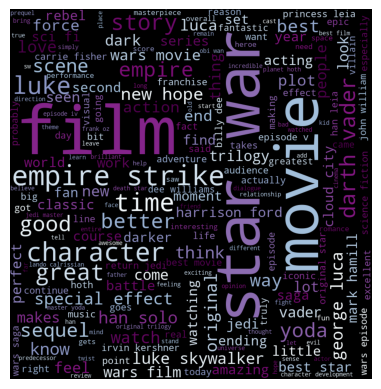

In [106]:
wc = WordCloud(background_color = 'black', mask = vader, contour_width = 2,
     contour_color = 'black', colormap = 'BuPu_r', width = 800, height = 500).generate(EpisodeV_text)
plt.axis("off")
plt.imshow(wc)

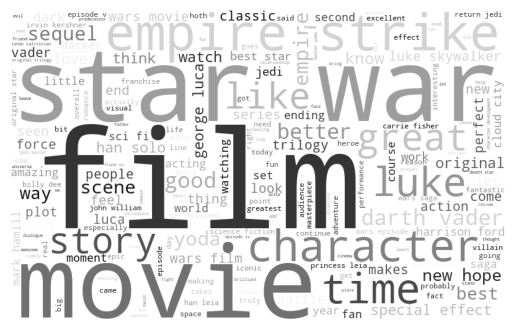

In [96]:
wc = WordCloud(background_color='white', colormap = 'binary',
     stopwords = ['meta'], width = 800, height = 500).generate(EpisodeV_text)
plt.axis("off")
plt.imshow(wc)

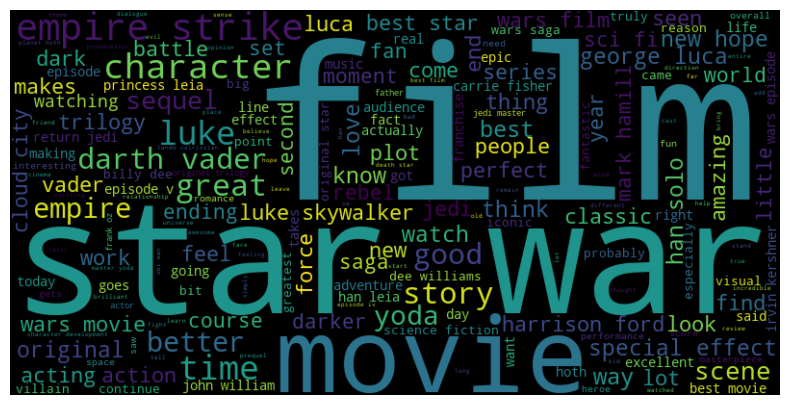

In [95]:

# Erstellen der Word Cloud
wordcloud = WordCloud(background_color="black", width=800, height=400).generate(EpisodeV_text)

# Anzeigen der Word Cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Achsen für die Darstellung nicht anzeigen
plt.show()

In [ ]:
print(gesamter_text)

In [ ]:
StarWars_Wordcloud[['bigram']] = StarWars_Wordcloud['bewertung_tokens'].progress_apply(lambda x: pd.Series(sentiment_Roberta(x)))

In [ ]:
alle_nomen = " ".join([" ".join(nomen) for nomen in StarWars_WordCloud['nomen']])

In [ ]:
gesamter_text = StarWars_WordCloud['bewertung'].str.cat(sep=' ')

In [ ]:
test_text = StarWars_WordCloud['bewertung'].head(10).str.cat(sep=' ')
print(test_text)